In [1]:
# importation des bibliothèques principales
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings(
    "ignore", category=DeprecationWarning)

# Preprocessing
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Modèles
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier, AdaBoostClassifier
# from sklearn.ensemble import BaggingClassifier, BaggingRegressor, GradientBoostingRegressor, VotingRegressor, StackingRegressor
from sklearn.tree import DecisionTreeClassifier

# Métriques
from sklearn.metrics import f1_score, confusion_matrix, classification_report, roc_auc_score, roc_curve

# Visualisations (matplotlib + seaborn + Plotly Express)
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import plotly.figure_factory as ff

# Style Jedha
sns.set_style('whitegrid')
COLORS = ["#4B9AC7", "#4BE8E0", "#9DD4F3", "#97FBF6", "#2A7FAF", "#23B1AB", "#0E3449", "#015955"]
sns.set_palette(COLORS)

In [2]:
dataset = pd.read_csv('conversion_data_train.csv') # chargement base de données d'entrainement
datasettest = pd.read_csv('conversion_data_test.csv') # chargement base de données de test
print(dataset.head()) # extrait base de données d'entrainement
print(f"Dataset d'entrainement : {dataset.shape}") # indication nb de lignes et colonnes de la base de données d'entraînement


   country  age  new_user  source  total_pages_visited  converted
0    China   22         1  Direct                    2          0
1       UK   21         1     Ads                    3          0
2  Germany   20         0     Seo                   14          1
3       US   23         1     Seo                    3          0
4       US   28         1  Direct                    3          0
Dataset d'entrainement : (284580, 6)


In [3]:
print(datasettest.head())# extrait base de données de test
print(f"Dataset de test : {datasettest.shape}")# indication nb de lignes et colonnes de la base de données de test

  country  age  new_user  source  total_pages_visited
0      UK   28         0     Seo                   16
1      UK   22         1  Direct                    5
2   China   32         1     Seo                    1
3      US   32         1     Ads                    6
4   China   25         0     Seo                    3
Dataset de test : (31620, 5)


In [4]:
dataset.info() # lecture des infos de la base de données
dataset.isnull().any().any() # contrôle de l'absence de valeurs nulles
display(100*dataset.isnull().sum()/dataset.shape[0])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284580 entries, 0 to 284579
Data columns (total 6 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   country              284580 non-null  object
 1   age                  284580 non-null  int64 
 2   new_user             284580 non-null  int64 
 3   source               284580 non-null  object
 4   total_pages_visited  284580 non-null  int64 
 5   converted            284580 non-null  int64 
dtypes: int64(4), object(2)
memory usage: 13.0+ MB


country                0.0
age                    0.0
new_user               0.0
source                 0.0
total_pages_visited    0.0
converted              0.0
dtype: float64

In [5]:
# Vue d'ensemble du dataset
display(dataset.describe(include='all')) # statistiques descriptives

,country,age,new_user,source,total_pages_visited,converted
count,284580,284580.000000,284580.000000,284580,284580.000000,284580.000000
unique,4,NaN,NaN,3,NaN,NaN
top,US,NaN,NaN,Seo,NaN,NaN
freq,160124,NaN,NaN,139477,NaN,NaN
mean,NaN,30.564203,0.685452,NaN,4.873252,0.032258
std,NaN,8.266789,0.464336,NaN,3.341995,0.176685
min,NaN,17.000000,0.000000,NaN,1.000000,0.000000
25%,NaN,24.000000,0.000000,NaN,2.000000,0.000000
50%,NaN,30.000000,1.000000,NaN,4.000000,0.000000
75%,NaN,36.000000,1.000000,NaN,7.000000,0.000000


In [6]:
dataset['age'].mean() # calcul age moyen

np.float64(30.56420338744817)

In [7]:
EcartType_age = dataset['age'].std() # écart-type age
EcartType_age

np.float64(8.26678940174741)

In [8]:
print(f"Age maximal de la distribution :", dataset['age'].max())
print(f"Age minimal de la distribution :", dataset['age'].min())

Age maximal de la distribution : 123
Age minimal de la distribution : 17


In [9]:
fig = px.box(dataset['age']) # ventilation par age
fig.show()

In [ ]:
# on repère 2 valeurs "outliers" à exclure
print("Avant :", len(dataset))
dataset = dataset[dataset["age"] < 80] # suppression 2 outliers > 80 ans
print("Après :", len(dataset))

Avant : 284580
Après : 284578


In [11]:
fig = px.box(dataset['age']) # ventilation par age après exclusion outliers
fig.show()

In [12]:
dataset['country'].unique() # vérification du nombre de pays (pour éviter problème de saisie) : 4

array(['China', 'UK', 'Germany', 'US'], dtype=object)

In [13]:
dataset['source'].unique() # vérification du nombre de source : 3

array(['Direct', 'Ads', 'Seo'], dtype=object)

=== DISTRIBUTION DE LA CIBLE ===
converted
0    275400
1      9178
Name: count, dtype: int64

Taux de conversion : 3.23%
Ratio d'imbalance : 30.0:1


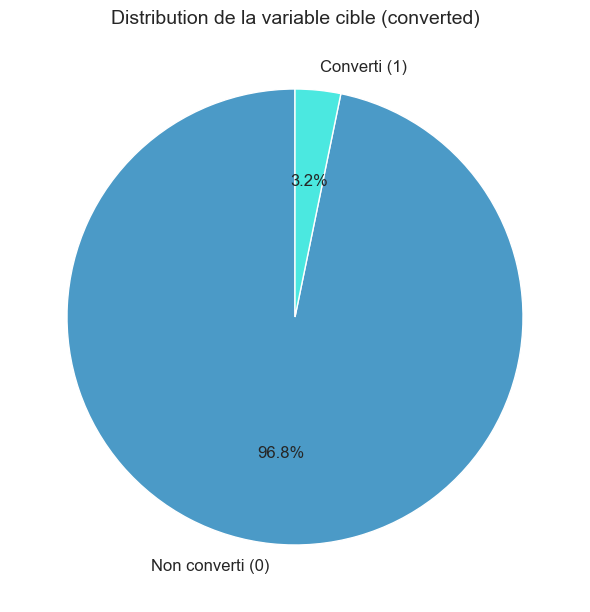

In [79]:
print("=== DISTRIBUTION DE LA CIBLE ===")
print(dataset['converted'].value_counts())
print()
print(f"Taux de conversion : {dataset['converted'].mean()*100:.2f}%")
print(f"Ratio d'imbalance : {dataset['converted'].value_counts()[0] / dataset['converted'].value_counts()[1]:.1f}:1")

fig, ax = plt.subplots(figsize=(6, 18))
counts = dataset['converted'].value_counts()
ax.pie(counts.values, labels=['Non converti (0)', 'Converti (1)'],
       autopct='%1.1f%%', colors=COLORS[:2], startangle=90,
       textprops={'fontsize': 12})
ax.set_title('Distribution de la variable cible (converted)', fontsize=14)
plt.tight_layout()
plt.show()

In [15]:
# Environ 1 personne sur 30 va s'abonner à la newsletter
# On en déduit que la métrique "accuracy" serait trompeuse car avec ce déséquilibre, un modèle qui prédit TOUJOURS 0 aurait une "accuracy" de 96,8 %
# Le F1-score serait plus adapté car cette métrique pénalise les faux négatifs et faux positifs
# L'utilisation de class_weight='balanced' améliorera la performance du modèle sur la classe minoritaire grâce à l'ajustement automatique.
# Le déséquilibre impose d'utiliser "stratify" lors du split entre les ensembles d'entrainement et de test

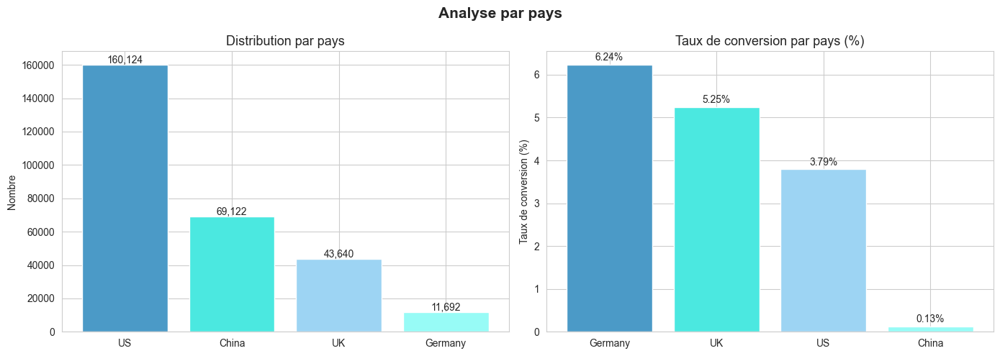

In [16]:
# Distribution par pays
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

country_counts = dataset['country'].value_counts()
conversion_by_country = dataset.groupby('country')['converted'].mean().sort_values(ascending=False) * 100

axes[0].bar(country_counts.index, country_counts.values, color=COLORS[:4])
axes[0].set_title('Distribution par pays', fontsize=13)
axes[0].set_ylabel('Nombre')
for i, v in enumerate(country_counts.values):
    axes[0].text(i, v + 1000, f'{v:,}', ha='center', fontsize=10)

axes[1].bar(conversion_by_country.index, conversion_by_country.values, color=COLORS[:4])
axes[1].set_title('Taux de conversion par pays (%)', fontsize=13)
axes[1].set_ylabel('Taux de conversion (%)')
for i, v in enumerate(conversion_by_country.values):
    axes[1].text(i, v + 0.1, f'{v:.2f}%', ha='center', fontsize=10)

plt.suptitle('Analyse par pays', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

In [17]:
# On constate que le taux de conversion ne suit pas nécessairement le volume d'utilisateurs.
# Les allemands sont les moins nombreux, mais ont un meilleur taux de conversion que les autres.
# A l'inverse, la Chine a un nombre d'utilisateurs important, mais un taux de conversion extrêmement faible.
# Afin de tenir compte de cet écart, on va créer une colonne à valeur binaire séparant les utilisateurs chinois des autres.

In [18]:
dataset['chinois'] = (dataset['country']=='China').astype(int)

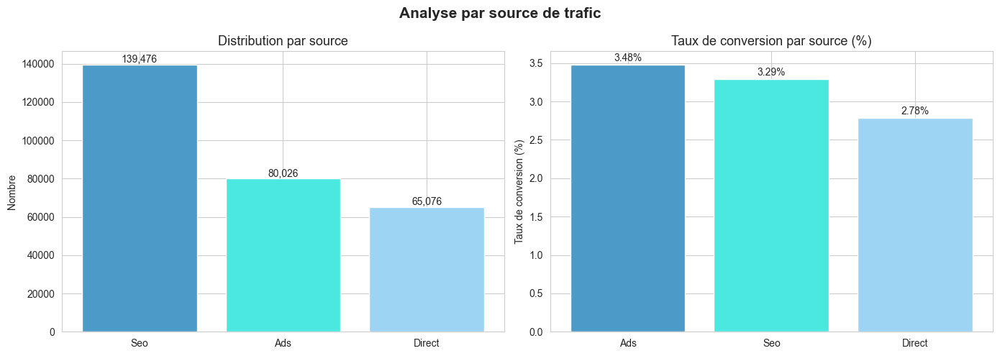

In [19]:
# Distribution par source
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

source_counts = dataset['source'].value_counts()
conversion_by_source = dataset.groupby('source')['converted'].mean().sort_values(ascending=False) * 100

axes[0].bar(source_counts.index, source_counts.values, color=COLORS[:3])
axes[0].set_title('Distribution par source', fontsize=13)
axes[0].set_ylabel('Nombre')
for i, v in enumerate(source_counts.values):
    axes[0].text(i, v + 1000, f'{v:,}', ha='center', fontsize=10)

axes[1].bar(conversion_by_source.index, conversion_by_source.values, color=COLORS[:3])
axes[1].set_title('Taux de conversion par source (%)', fontsize=13)
axes[1].set_ylabel('Taux de conversion (%)')
for i, v in enumerate(conversion_by_source.values):
    axes[1].text(i, v + 0.05, f'{v:.2f}%', ha='center', fontsize=10)

plt.suptitle('Analyse par source de trafic', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

In [20]:
# Les taux de conversion sont assez proches les uns des autres selon les axes de contact, et tous assez faibles.
# La source a donc une influence limitée sur le taux de conversion.
# On constate néanmoins que la publicité (ADS) présente un taux un peu plus élevé, 
# sans doute parce que les campagnes publicitaires ciblent déjà un public prêt à s'abonner.

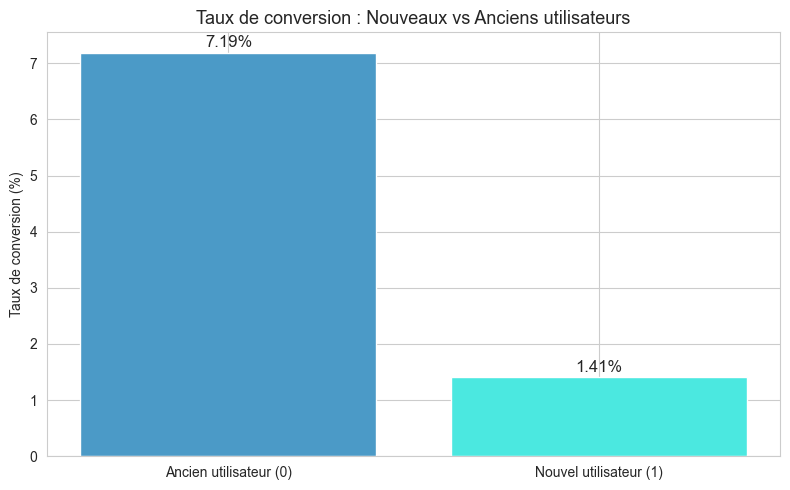

Les anciens utilisateurs convertissent 5.1 x plus que les nouveaux !


In [21]:
# Analyse nouveaux utilisateurs par rapport à la conversion
conversion_by_user = dataset.groupby('new_user')['converted'].mean() * 100

fig, ax = plt.subplots(figsize=(8, 5))
bars = ax.bar(['Ancien utilisateur (0)', 'Nouvel utilisateur (1)'],
              conversion_by_user.values, color=COLORS[:2])
ax.set_title('Taux de conversion : Nouveaux vs Anciens utilisateurs', fontsize=13)
ax.set_ylabel('Taux de conversion (%)')
for bar, v in zip(bars, conversion_by_user.values):
    ax.text(bar.get_x() + bar.get_width()/2, v + 0.1, f'{v:.2f}%', ha='center', fontsize=12)
plt.tight_layout()
plt.show()

print(f"Les anciens utilisateurs convertissent {conversion_by_user[0]/conversion_by_user[1]:.1f} x plus que les nouveaux !")
     

In [22]:
# Cette fois-ci, il est flagrant qu'un ancien utilisateur qui connait donc déjà le site aura davantage 
# de probabilité de s'abonner à nouveau à la newsletter.
# On va créer une colonne mesurant l'interaction entre le statut d'ancien utilisateur et le nombre de pages visitées.

In [23]:
dataset['réengagement'] = (1 - dataset['new_user']) * dataset['total_pages_visited']

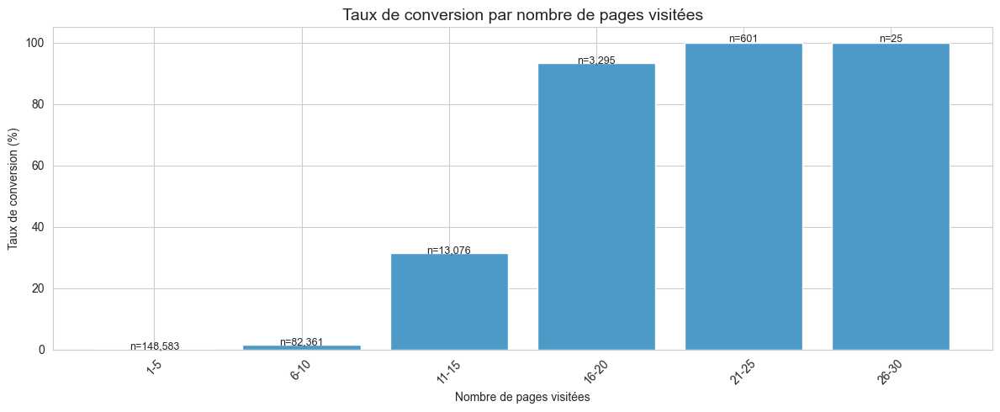

In [24]:
# Taux de conversion par rapport au nombre de pages visitées
bins2 = [1, 5, 10, 15, 20, 25, 30]
labels2 = ['1-5', '6-10', '11-15', '16-20', '21-25', '26-30']
dataset['page_visited_bin'] = pd.cut(dataset['total_pages_visited'], bins=bins2, labels=labels2)
page_conversion = dataset.groupby('page_visited_bin', observed=True)['converted'].agg(['mean', 'count']).reset_index()
page_conversion['mean'] = page_conversion['mean'] * 100

fig, ax = plt.subplots(figsize=(12, 5))
bars = ax.bar(page_conversion['page_visited_bin'].astype(str), page_conversion['mean'], color=COLORS[0])
ax.set_title("Taux de conversion par nombre de pages visitées", fontsize=14)
ax.set_xlabel("Nombre de pages visitées")
ax.set_ylabel('Taux de conversion (%)')
for bar, (_, row) in zip(bars, page_conversion.iterrows()):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
            f"n={row['count']:,.0f}", ha='center', fontsize=9)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

dataset.drop('page_visited_bin', axis=1, inplace=True)

In [ ]:
# On constate que 100 % des utilisateurs qui ont visité plus de 21 pages se sont abonnés à la newsletter.
# C'est un indicateur très important dans la prédiction d'abonnement.
# On va créer une colonne à valeur binaire séparant les utilisateurs qui ont visité plus de 10 pages des autres
# seuil à partir duquel le taux de conversion devient important.

In [26]:
dataset['bcppages'] = (dataset['total_pages_visited']>=10).astype(int)

In [27]:
nbmoyen_pages_par_age = dataset['total_pages_visited'].mean()
nbmoyen_pages_par_age

np.float64(4.8731982092783)

In [28]:
# Nombre de pages par tranche d'age
bins = [16, 20, 25, 30, 35, 40, 50, 60, 130]
labels = ['17-20', '21-25', '26-30', '31-35', '36-40', '41-50', '51-60', '60+']
dataset['pages_par_age'] = pd.cut(dataset['age'], bins=bins, labels=labels)
essai = dataset.groupby('pages_par_age', observed=True)['total_pages_visited'].agg(['mean', 'count']).reset_index()
essai['mean'] = essai['mean']

In [29]:
print(dataset['pages_par_age'])

0         21-25
1         21-25
2         17-20
3         21-25
4         26-30
          ...  
284575    36-40
284576    31-35
284577    41-50
284578    31-35
284579    26-30
Name: pages_par_age, Length: 284578, dtype: category
Categories (8, object): ['17-20' < '21-25' < '26-30' < '31-35' < '36-40' < '41-50' < '51-60' < '60+']


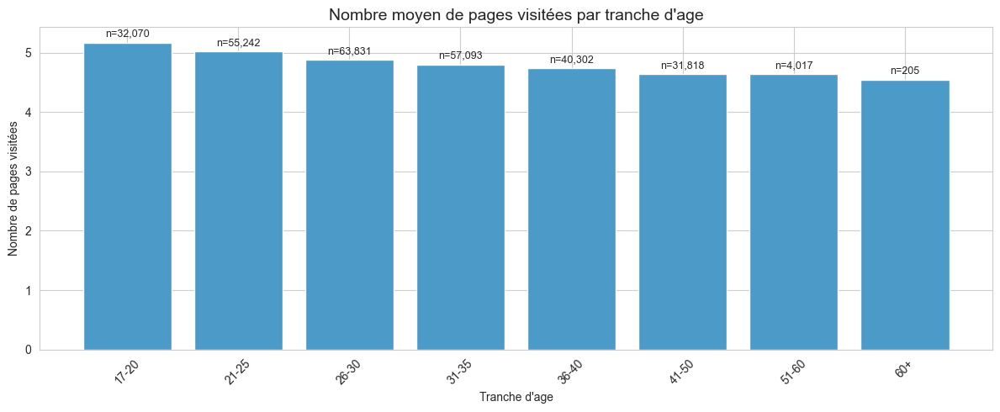

In [30]:
fig, ax = plt.subplots(figsize=(12, 5))
bars = ax.bar(essai['pages_par_age'].astype(str), essai['mean'], color=COLORS[0])
ax.set_title("Nombre moyen de pages visitées par tranche d'age", fontsize=14)
ax.set_xlabel("Tranche d'age")
ax.set_ylabel('Nombre de pages visitées')
for bar, (_, row) in zip(bars, essai.iterrows()):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
            f"n={row['count']:,.0f}", ha='center', fontsize=9)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

dataset.drop('pages_par_age', axis=1, inplace=True)

In [31]:
# Le nombre moyen de pages visitées par tranche d'age nous donne peu d'informations.
# En effet, la moyenne globale est d'environ 4,8 pages, et les moyennes par tranche d'age présentent, 
# certes des variations mais finalement faibles.
# Néanmoins, on repère une légère diminution du nombre de pages visitées au fur-et-à-mesure que l'age augmente. 

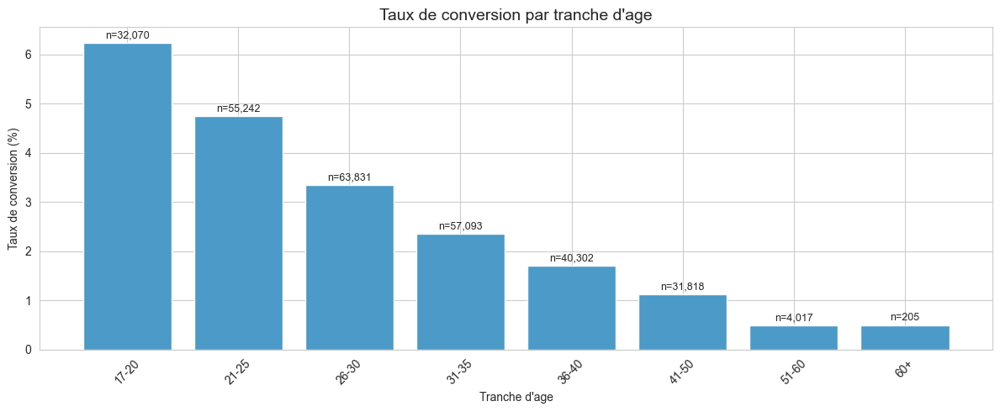

In [32]:
# Taux de conversion par tranche d'age
bins = [16, 20, 25, 30, 35, 40, 50, 60, 130]
labels = ['17-20', '21-25', '26-30', '31-35', '36-40', '41-50', '51-60', '60+']
dataset['age_bin'] = pd.cut(dataset['age'], bins=bins, labels=labels)
age_conversion = dataset.groupby('age_bin', observed=True)['converted'].agg(['mean', 'count']).reset_index()
age_conversion['mean'] = age_conversion['mean'] * 100

fig, ax = plt.subplots(figsize=(12, 5))
bars = ax.bar(age_conversion['age_bin'].astype(str), age_conversion['mean'], color=COLORS[0])
ax.set_title("Taux de conversion par tranche d'age", fontsize=14)
ax.set_xlabel("Tranche d'age")
ax.set_ylabel('Taux de conversion (%)')
for bar, (_, row) in zip(bars, age_conversion.iterrows()):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
            f"n={row['count']:,.0f}", ha='center', fontsize=9)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

dataset.drop('age_bin', axis=1, inplace=True)

In [33]:
# Le taux de conversion le plus élevé concerne la population des 17-20 ans, et diminue quand l'age augmente.
# Cette évolution est plus sensible et justifie d'établir une colonne à valeur binaire séparant les moins de 25 ans des autres.

In [34]:
dataset['jeunes'] = (dataset['age']<=25).astype(int)

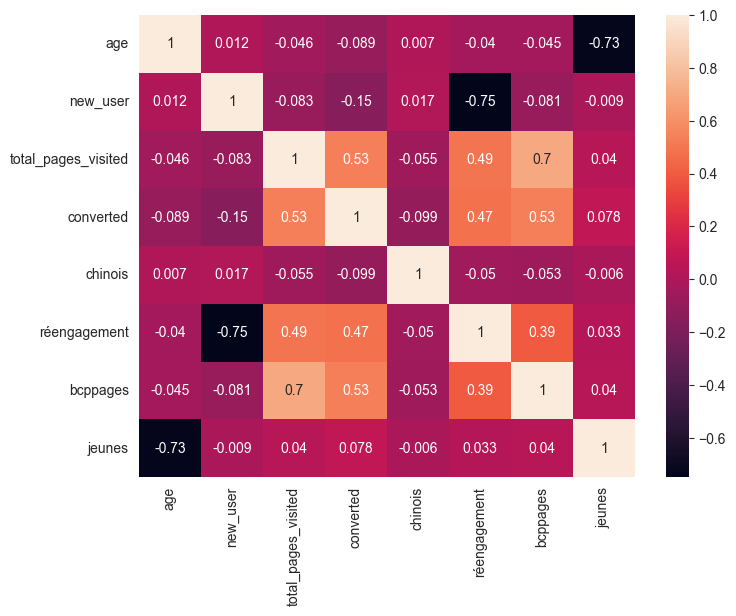

In [ ]:
# Matrice de Corrélation
corr_matrix = dataset.corr(numeric_only=True).round(3)

plt.figure(figsize=(8,6))
sns.heatmap(corr_matrix, annot=True)
plt.show() 
# Les différentes valeurs sont peu corrélées avec "converted".
# La valeur la plus corrélée avec "converted" est "Total_pages_visited" avec 0,53 ce qui reste assez limité.

In [36]:
dataset_sample = dataset.sample(10000, random_state=42) # création d'un échantillon
dataset_sample

,country,age,new_user,source,total_pages_visited,converted,chinois,réengagement,bcppages,jeunes
183416,US,43,1,Seo,3,0,0,0,0,0
264730,US,37,1,Seo,13,0,0,0,1,0
42827,China,40,1,Seo,2,0,1,0,0,0
173170,China,24,0,Direct,8,0,1,8,0,1
275694,UK,38,1,Direct,5,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
28319,US,49,1,Direct,1,0,0,0,0,0
176564,Germany,41,1,Seo,6,0,0,0,0,0
176601,China,27,0,Seo,2,0,1,2,0,0
156395,UK,42,1,Ads,6,0,0,0,0,0


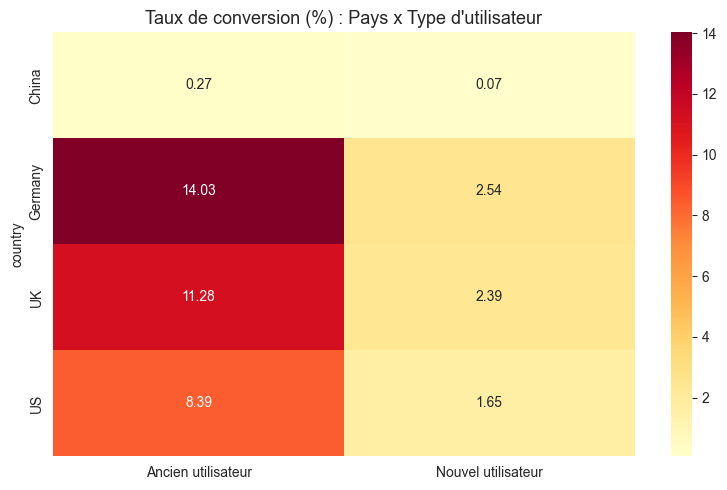

In [82]:
# Interaction entre "country" et "new_user"
cross_tab = dataset.pivot_table(values='converted', index='country', columns='new_user', aggfunc='mean') * 100
cross_tab.columns = ['Ancien utilisateur', 'Nouvel utilisateur']

fig, ax = plt.subplots(figsize=(8, 5))
sns.heatmap(cross_tab, annot=True, fmt='.2f', cmap='YlOrRd', ax=ax)
ax.set_title("Taux de conversion (%) : Pays x Type d'utilisateur", fontsize=13)
plt.tight_layout()
plt.show()

In [ ]:
# Hors mis pour la Chine, le rapport entre les conversions chez les anciens et chez les nouveaux utilisateurs est assez proche de 5,
# confortant le résultat déjà évoqué précédemment du taux de conversion entre nouveaux et anciens utilisateurs.

In [ ]:
# === FEATURE ENGINEERING === en vue de l'amélioration de performance de modèle d'apprentissage automatique

def feature_engineering(df):
    """
    Applique le feature engineering sur un DataFrame.
    A utiliser aussi bien sur train que sur test.
    """
    df = df.copy()
    
    # 1. jeunes (les jeunes convertissent plus)
    df['jeunes'] = (df['age'] <= 25).astype(int)
    
    # 2. chinois (la Chine a un taux de conversion tres différent)
    df['chinois'] = (df['country'] == 'China').astype(int)
    
    # 3. bcppages (beaucoup de pages visitées)
    df['bcppages'] = (df['total_pages_visited'] >= 10).astype(int)
    
    # 4. réengagement (interaction ancien user x pages)
    df['réengagement'] = (1 - df['new_user']) * df['total_pages_visited']
    
    return df

dataset = feature_engineering(dataset)
print("Features apres engineering :")
print(dataset.columns.tolist())
print(f"\nShape : {dataset.shape}")
display(dataset.head())

Features apres engineering :
['country', 'age', 'new_user', 'source', 'total_pages_visited', 'converted', 'chinois', 'réengagement', 'bcppages', 'jeunes']

Shape : (284578, 10)


,country,age,new_user,source,total_pages_visited,converted,chinois,réengagement,bcppages,jeunes
0,China,22,1,Direct,2,0,1,0,0,1
1,UK,21,1,Ads,3,0,0,0,0,1
2,Germany,20,0,Seo,14,1,0,14,1,1
3,US,23,1,Seo,3,0,0,0,0,1
4,US,28,1,Direct,3,0,0,0,0,0


In [40]:
features_list = ['country', 'age', 'new_user', 'source', 'total_pages_visited', 'chinois', 'réengagement', 'bcppages', 'jeunes'] # valeurs explicatives
target_variable = 'converted' # objectif de prédiction

In [41]:
X = dataset.loc[:, features_list]
Y = dataset.loc[:, target_variable]

print('Variables exploratoires : ', X.columns)
print()

Variables exploratoires :  Index(['country', 'age', 'new_user', 'source', 'total_pages_visited',
       'chinois', 'réengagement', 'bcppages', 'jeunes'],
      dtype='object')



In [ ]:
numeric_features = ['age', 'total_pages_visited', 'réengagement'] # liste des valeurs numériques
categorical_features = ['country', 'source'] # liste des valeurs catégorielles
binary_features = ['new_user', 'chinois', 'bcppages', 'jeunes'] # liste des valeurs binaires
all_features = numeric_features + categorical_features + binary_features

In [43]:
print(f"Numeric features ({len(numeric_features)}): {numeric_features}")
print(f"Categorical features ({len(categorical_features)}): {categorical_features}")
print(f"Binary features ({len(binary_features)}): {binary_features}")
print(f"Total features: {len(all_features)}")

Numeric features (3): ['age', 'total_pages_visited', 'réengagement']
Categorical features (2): ['country', 'source']
Binary features (4): ['new_user', 'chinois', 'bcppages', 'jeunes']
Total features: 9


In [44]:
# Séparation entre ensembles d'entrainement et de test avant apprentissage (test = 20%)
print("Séparation entre ensembles d'entrainement et de test...")
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42, stratify=Y)
# stratify=Y permet de garder le même ratio "converted/non-converted" entre les ensembles d'entrainement et de test
print("...Fait.")
print()

Séparation entre ensembles d'entrainement et de test...
...Fait.



In [45]:
# évaluation des ensembles d'entrainement et de test
print(f"X_train: {X_train.shape}, X_test: {X_test.shape}")
print(f"Y_train distribution: {Y_train.value_counts(normalize=True).to_dict()}")
print(f"Y_test distribution: {Y_test.value_counts(normalize=True).to_dict()}")

X_train: (227662, 9), X_test: (56916, 9)
Y_train distribution: {0: 0.9677504370514183, 1: 0.03224956294858167}
Y_test distribution: {0: 0.967741935483871, 1: 0.03225806451612903}


In [46]:
# Sélection des prétraitements
print("Encodage des valeurs catégorielles et standardisation des valeurs numériques...")

numpreproc = Pipeline(steps=[('scaler', StandardScaler())])
catpreproc = Pipeline(steps=[('onehot', OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore'))])
# prévient les erreurs si le test set contient des valeurs inconnues

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numpreproc, numeric_features),
        ('cat', catpreproc, categorical_features),
        ('bin', 'passthrough', binary_features) # pas de traitement car valeurs binaires
    ])
print("Fait...")

Encodage des valeurs catégorielles et standardisation des valeurs numériques...
Fait...


In [47]:
X_train_processed = preprocessor.fit_transform(X_train)
X_test_processed = preprocessor.transform(X_test)

In [ ]:
# Récupérer les noms de colonnes après preprocessing
cat_feature_names = preprocessor.named_transformers_['cat'].named_steps['onehot'].get_feature_names_out(categorical_features)
all_feature_names = list(numeric_features) + list(cat_feature_names) + binary_features

print(f"Shape apres preprocessing : {X_train_processed.shape}")
print(f"Feature names : {all_feature_names}")
# le nombre de colonnes a augmenté suite à la ventilation des différents pays en colonnes distinctes

Shape apres preprocessing : (227662, 12)
Feature names : ['age', 'total_pages_visited', 'réengagement', 'country_Germany', 'country_UK', 'country_US', 'source_Direct', 'source_Seo', 'new_user', 'chinois', 'bcppages', 'jeunes']


In [49]:
print("Exécution du prétraitement sur l'ensemble d'entrainement...")
print(X_train.head())
X_train_process = preprocessor.fit_transform(X_train)
print('...Fait.')
print(X_train_process[0:5,:])
print()

Exécution du prétraitement sur l'ensemble d'entrainement...
        country  age  new_user  source  total_pages_visited  chinois  \
14322        UK   37         1     Ads                    3        0   
251570       UK   27         0     Seo                   13        0   
53008        US   26         0  Direct                    4        0   
121373       US   24         0     Seo                    1        0   
151639  Germany   33         0     Ads                    2        0   

        réengagement  bcppages  jeunes  
14322              0         0       0  
251570            13         1       0  
53008              4         0       0  
121373             1         0       1  
151639             2         0       0  
...Fait.
[[ 0.77869487 -0.56105227 -0.50690153  0.          1.          0.
   0.          0.          1.          0.          0.          0.        ]
 [-0.43027253  2.43067457  3.46383807  0.          1.          0.
   0.          1.          0.          0.    

In [50]:
print("Exécution du prétraitement sur l'ensemble de test...")
print(X_test.head())
X_test_process = preprocessor.transform(X_test)
print('...Fait.')
print(X_test_process[0:5,:])
print()

Exécution du prétraitement sur l'ensemble de test...
       country  age  new_user  source  total_pages_visited  chinois  \
144383   China   37         1  Direct                    2        1   
38219    China   44         1     Ads                    3        1   
227834      UK   24         0  Direct                   16        0   
221762      UK   34         1     Ads                    3        0   
224969      US   24         1     Ads                    5        0   

        réengagement  bcppages  jeunes  
144383             0         0       0  
38219              0         0       0  
227834            16         1       1  
221762             0         0       0  
224969             0         0       1  
...Fait.
[[ 0.77869487 -0.86022495 -0.50690153  0.          0.          0.
   1.          0.          1.          1.          0.          0.        ]
 [ 1.62497205 -0.56105227 -0.50690153  0.          0.          0.
   0.          0.          1.          1.          0.     

In [51]:
# Modèle d'entrainement
print("Modèle d'entrainement...")
classifier = LogisticRegression(max_iter=1000, class_weight='balanced', random_state=42) # 
classifier.fit(X_train_process, Y_train)
print("...Fait.")

Modèle d'entrainement...
...Fait.


In [ ]:
# Prédictions sur ensemble d'entrainement
print("Prédictions sur ensemble d'entrainement...")
Y_train_pred = classifier.predict(X_train_process)
print("...Fait.")
print(Y_train_pred)
print()

Predictions sur ensemble d'entrainement...
...Fait.
[0 1 0 ... 0 0 0]



In [ ]:
# Prédictions sur ensemble test
print("Prédictions sur ensemble test...")
Y_test_pred = classifier.predict(X_test_process)
print("...Done.")
print(Y_test_pred)
print()

Predictions sur ensemble test...
...Done.
[0 0 1 ... 0 0 0]



In [54]:
# Comparaison des scores F1 sur les ensembles d'entrainement et de test
print("f1-score on train set : ", f1_score(Y_train, Y_train_pred))
print("f1-score on test set : ", f1_score(Y_test, Y_test_pred))

f1-score on train set :  0.5125534684768458
f1-score on test set :  0.5119952317091343


In [55]:
# On va utiliser d'autres métriques de performance pour mieux comprendre ce que fait le modèle
print("Confusion matrix on train set : ")
print(f"\nClassification Report (test) :")
print(classification_report(Y_test, Y_test_pred))
print(confusion_matrix(Y_train, Y_train_pred))
print()
print("Confusion matrix on test set : ")
print(confusion_matrix(Y_test, Y_test_pred))
print()

Confusion matrix on train set : 

Classification Report (test) :
              precision    recall  f1-score   support

           0       1.00      0.94      0.97     55080
           1       0.35      0.94      0.51      1836

    accuracy                           0.94     56916
   macro avg       0.68      0.94      0.74     56916
weighted avg       0.98      0.94      0.95     56916

[[207667  12653]
 [   452   6890]]

Confusion matrix on test set : 
[[51923  3157]
 [  118  1718]]



In [56]:
# === COMPARAISON DE PLUSIEURS MODELES ===
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000, class_weight='balanced', random_state=42),
    'Random Forest': RandomForestClassifier(n_estimators=200, class_weight='balanced', random_state=42, n_jobs=-1),
    'Gradient Boosting': GradientBoostingClassifier(n_estimators=200, learning_rate=0.1, max_depth=5, random_state=42),
    'Decision Tree': DecisionTreeClassifier(class_weight='balanced', random_state=42, max_depth=10),
    'AdaBoost': AdaBoostClassifier(n_estimators=100, learning_rate= 1)
}

results = []

for name, model in models.items():
    print(f"\n{'='*60}")
    print(f"Training: {name}")
    print(f"{'='*60}")
    
    model.fit(X_train_process, Y_train)
    Y_train_pred = model.predict(X_train_process)
    Y_test_pred = model.predict(X_test_process)
    
    f1_train = f1_score(Y_train, Y_train_pred)
    f1_test = f1_score(Y_test, Y_test_pred)
    cv_scores = cross_val_score(model, X_train_process, Y_train, cv=5, scoring='f1', n_jobs=-1)
    
    print(f"F1-score train : {f1_train:.4f}")
    print(f"F1-score test  : {f1_test:.4f}")
    print(f"F1-score CV    : {cv_scores.mean():.4f} (+/- {cv_scores.std():.4f})")
    print(f"Confusion matrix (test):\n{confusion_matrix(Y_test, Y_test_pred)}")
    
    results.append({
        'Model': name,
        'F1 Train': f1_train,
        'F1 Test': f1_test,
        'F1 CV Mean': cv_scores.mean(),
        'F1 CV Std': cv_scores.std()
    })

results_df = pd.DataFrame(results).sort_values('F1 Test', ascending=False)
print("\n\n" + "="*60)
print("RECAPITULATIF DES RESULTATS")
print("="*60)
display(results_df)


Training: Logistic Regression
F1-score train : 0.5126
F1-score test  : 0.5120
F1-score CV    : 0.5113 (+/- 0.0019)
Confusion matrix (test):
[[51923  3157]
 [  118  1718]]

Training: Random Forest
F1-score train : 0.6425
F1-score test  : 0.5766
F1-score CV    : 0.5795 (+/- 0.0031)
Confusion matrix (test):
[[53161  1919]
 [  315  1521]]

Training: Gradient Boosting
F1-score train : 0.7765
F1-score test  : 0.7529
F1-score CV    : 0.7610 (+/- 0.0075)
Confusion matrix (test):
[[54857   223]
 [  593  1243]]

Training: Decision Tree
F1-score train : 0.5175
F1-score test  : 0.5067
F1-score CV    : 0.5049 (+/- 0.0083)
Confusion matrix (test):
[[51927  3153]
 [  143  1693]]

Training: AdaBoost
F1-score train : 0.7416
F1-score test  : 0.7409
F1-score CV    : 0.7408 (+/- 0.0060)
Confusion matrix (test):
[[54834   246]
 [  611  1225]]


RECAPITULATIF DES RESULTATS


,Model,F1 Train,F1 Test,F1 CV Mean,F1 CV Std
2,Gradient Boosting,0.776474,0.752877,0.760962,0.007540
4,AdaBoost,0.741639,0.740853,0.740783,0.006016
1,Random Forest,0.642527,0.576573,0.579512,0.003149
0,Logistic Regression,0.512553,0.511995,0.511299,0.001950
3,Decision Tree,0.517542,0.506735,0.504934,0.008282


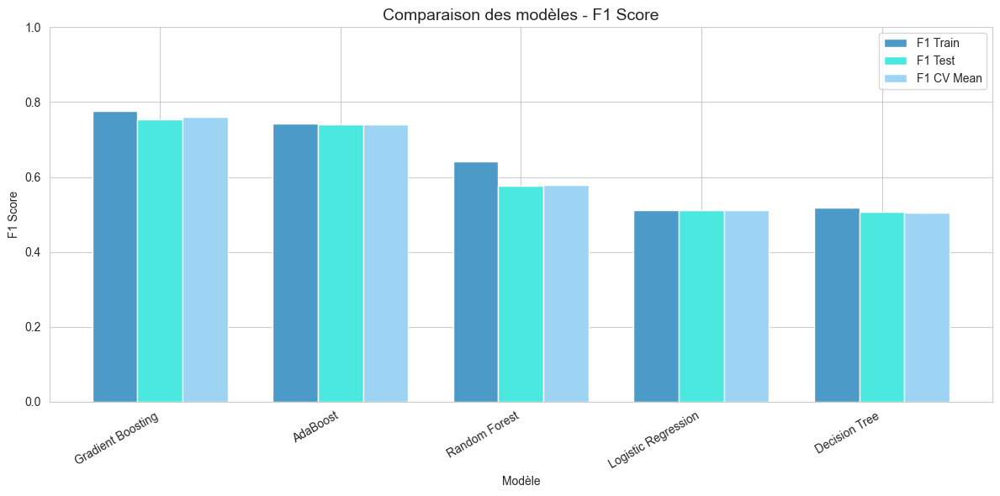

In [84]:
# Visualisation des résultats
fig, ax = plt.subplots(figsize=(12, 6))
x = np.arange(len(results_df))
width = 0.25

ax.bar(x - width, results_df['F1 Train'], width, label='F1 Train', color=COLORS[0])
ax.bar(x, results_df['F1 Test'], width, label='F1 Test', color=COLORS[1])
ax.bar(x + width, results_df['F1 CV Mean'], width, label='F1 CV Mean', color=COLORS[2])

ax.set_xlabel('Modèle')
ax.set_ylabel('F1 Score')
ax.set_title('Comparaison des modèles - F1 Score', fontsize=14)
ax.set_xticks(x)
ax.set_xticklabels(results_df['Model'], rotation=30, ha='right')
ax.legend()
ax.set_ylim(0, 1)
plt.tight_layout()
plt.show()

In [58]:
# Les modèles ADA BOOST et LOGISTIC REGRESSION présentent des résultats similaires sur les ensembles d'entrainement et de test,
# ce qui exclue l'overfitting.
# Le modèle DECISION TREE présente un écart qui reste raisonnable et n'implique pas de traitement visant à limiter l'overfitting.
# Les deux autres modèles (GRADIENT BOOSTING et RANDOM FOREST) présentent des écarts plus importants que nous allons tenter de
# traiter pour limiter l'overfitting.
# Toutefois, pour le GRADIENT BOOSTING, l'écart-type est faible ce qui indique une certaine stabilité du modèle.

In [59]:
# === GRIDSEARCH LEGER SUR GRADIENT BOOSTING ===
print("GridSearch léger sur Gradient Boosting...")

# Grille des valeurs à tester
params_gb = {
    "n_estimators": [200],
    "max_depth": [5, 7],
    'learning_rate' : [0.1],
}
# 1 x 2 x 1 = 2 combinaisons x 3 folds = 6 fits seulement

cv_strategy = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

gridsearch_gb = GridSearchCV(
    GradientBoostingClassifier(random_state=42, subsample=0.8),
    params_gb,
    cv=cv_strategy,
    scoring='f1',
    n_jobs=-1,
    verbose=1
)

gridsearch_gb.fit(X_train_process, Y_train)
print("...Fait.")
print(f"\nMeilleur hyperparamètres : , {gridsearch_gb.best_params_}")
print(f"\nMeilleure précision de validation F1 CV : , {gridsearch_gb.best_score_:.4f}")



GridSearch léger sur Gradient Boosting...
Fitting 3 folds for each of 2 candidates, totalling 6 fits
...Fait.

Meilleur hyperparamètres : , {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200}

Meilleure précision de validation F1 CV : , 0.7562


In [60]:
# === GRIDSEARCH LEGER SUR RANDOM FOREST ===
print("GridSearch leger sur Random Forest...")

params_rf = {
    'n_estimators': [200],
    'max_depth': [15, None],
    'class_weight': ['balanced']
}
# 1x2x1 = 2 combinaisons x 3 folds = 6 fits seulement

gridsearch_rf = GridSearchCV(
    RandomForestClassifier(random_state=42, n_jobs=-1),
    params_rf,
    cv=cv_strategy,
    scoring='f1',
    n_jobs=-1,
    verbose=1
)

gridsearch_rf.fit(X_train_process, Y_train)

print(f"\nMeilleurs hyperparamètres : , {gridsearch_rf.best_params_}")
print(f"\nMeilleure précision de validation F1 CV : {gridsearch_rf.best_score_:.4f}")

GridSearch leger sur Random Forest...
Fitting 3 folds for each of 2 candidates, totalling 6 fits

Meilleurs hyperparamètres : , {'class_weight': 'balanced', 'max_depth': 15, 'n_estimators': 200}

Meilleure précision de validation F1 CV : 0.5923


In [61]:
# === EVALUATION DES MEILLEURS MODELES ===
print("\n" + "="*60)
print("MEILLEURS MODELES APRES GRIDSEARCH")
print("="*60)

best_models = {
    'Best Gradient Boosting': gridsearch_gb.best_estimator_,
    'Best Random Forest': gridsearch_rf.best_estimator_
}

best_results = []

for name, model in best_models.items():
    Y_test_pred = model.predict(X_test_process)
    f1_test = f1_score(Y_test, Y_test_pred)
    
    print(f"\n{name}:")
    print(f"  F1-score test: {f1_test:.4f}")
    print(f"  Classification Report:")
    print(classification_report(Y_test, Y_test_pred))
    print(f"  Confusion matrix:\n{confusion_matrix(Y_test, Y_test_pred)}")
    
    best_results.append({'Model': name, 'F1 Test': f1_test})

best_results_df = pd.DataFrame(best_results).sort_values('F1 Test', ascending=False)
display(best_results_df)


MEILLEURS MODELES APRES GRIDSEARCH

Best Gradient Boosting:
  F1-score test: 0.7549
  Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     55080
           1       0.85      0.68      0.75      1836

    accuracy                           0.99     56916
   macro avg       0.92      0.84      0.87     56916
weighted avg       0.98      0.99      0.99     56916

  Confusion matrix:
[[54869   211]
 [  595  1241]]

Best Random Forest:
  F1-score test: 0.5813
  Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.96      0.98     55080
           1       0.44      0.84      0.58      1836

    accuracy                           0.96     56916
   macro avg       0.72      0.90      0.78     56916
weighted avg       0.98      0.96      0.97     56916

  Confusion matrix:
[[53145  1935]
 [  291  1545]]


,Model,F1 Test
0,Best Gradient Boosting,0.754866
1,Best Random Forest,0.581264


In [62]:
# === SELECTIONNER LE MEILLEUR MODELE ===
best_model_name = best_results_df.iloc[0]['Model']
best_model = best_models[best_model_name]
print(f"Meilleur modèle sélectionné : {best_model_name}")
print(f"F1-score test : {best_results_df.iloc[0]['F1 Test']:.4f}")
     

Meilleur modèle sélectionné : Best Gradient Boosting
F1-score test : 0.7549


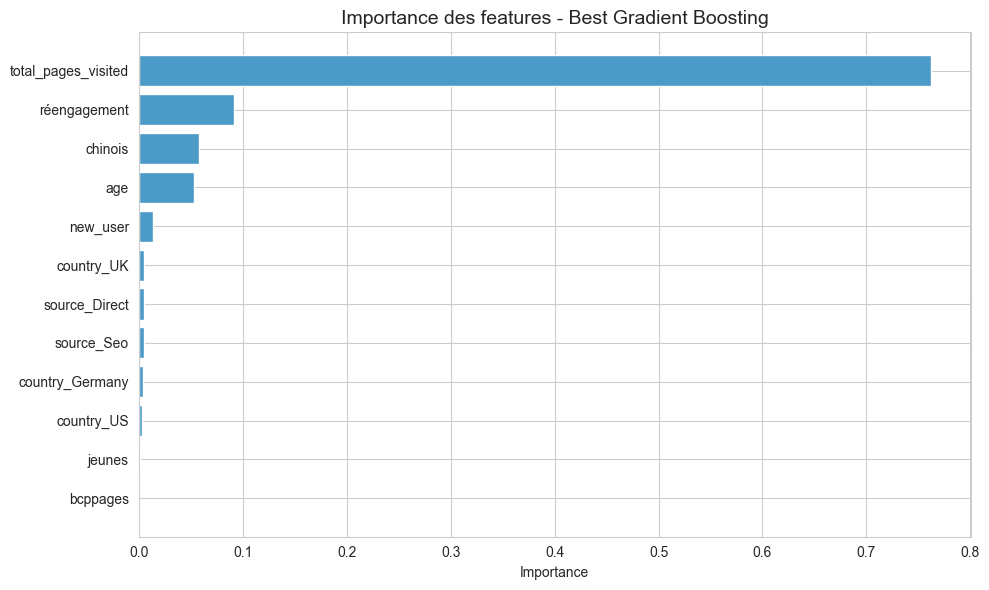


Top 5 features les plus importantes :


,Feature,Importance
1,total_pages_visited,0.762135
2,réengagement,0.091121
9,chinois,0.057690
0,age,0.053520
8,new_user,0.013694


In [63]:
# === IMPORTANCE DES FEATURES ===
if hasattr(best_model, 'feature_importances_'):
    importances = best_model.feature_importances_
    feature_importance_df = pd.DataFrame({
        'Feature': all_feature_names,
        'Importance': importances
    }).sort_values('Importance', ascending=True)
    
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color=COLORS[0])
    ax.set_title(f'Importance des features - {best_model_name}', fontsize=14)
    ax.set_xlabel('Importance')
    plt.tight_layout()
    plt.show()
    
    print("\nTop 5 features les plus importantes :")
    display(feature_importance_df.sort_values('Importance', ascending=False).head())

In [64]:
# Il ressort que le nombre total de pages visitées est l'élément prépondérant pour déterminer s'il va y avoir conversion.
# La valeur "réengagement" a une incidence moindre mais néanmoins importante.
# Les autres éléments influencent le résultat de manière encore moins significative.

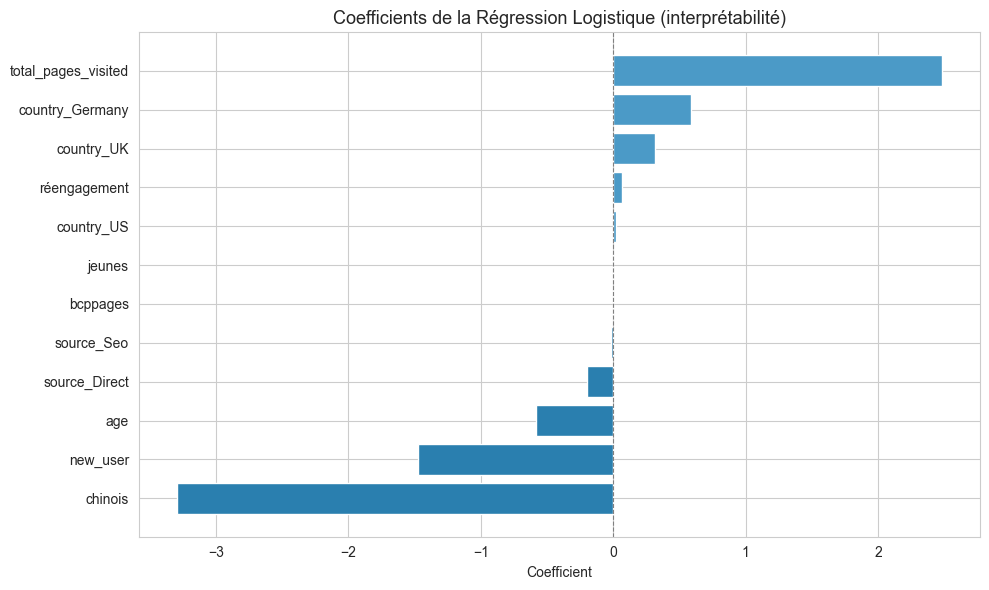


Coefficients (valeur absolue) :


,Feature,Coefficient,Abs_Coefficient
9,chinois,-3.294519,3.294519
1,total_pages_visited,2.481463,2.481463
8,new_user,-1.475976,1.475976
3,country_Germany,0.590530,0.590530
0,age,-0.579711,0.579711
4,country_UK,0.312243,0.312243
6,source_Direct,-0.200874,0.200874
2,réengagement,0.064997,0.064997
5,country_US,0.024424,0.024424
7,source_Seo,-0.020299,0.020299


In [86]:
# === COEFFICIENTS DE LA REGRESSION LOGISTIQUE ===
lr_full = LogisticRegression(max_iter=1000, class_weight='balanced', random_state=42)
lr_full.fit(X_train_processed, Y_train)

coef_df = pd.DataFrame({
    'Feature': all_feature_names,
    'Coefficient': lr_full.coef_[0]
}).sort_values('Coefficient', ascending=True)

fig, ax = plt.subplots(figsize=(10, 6))
colors_coef = [COLORS[4] if c < 0 else COLORS[0] for c in coef_df['Coefficient']]
ax.barh(coef_df['Feature'], coef_df['Coefficient'], color=colors_coef)
ax.set_title('Coefficients de la Régression Logistique (interprétabilité)', fontsize=13)
ax.set_xlabel('Coefficient')
ax.axvline(x=0, color='gray', linestyle='--', linewidth=0.8)
plt.tight_layout()
plt.show()

print("\nCoefficients (valeur absolue) :")
coef_df['Abs_Coefficient'] = coef_df['Coefficient'].abs()
display(coef_df.sort_values('Abs_Coefficient', ascending=False))

In [66]:
# Il apparaît ici que les éléments les plus hauts dont les valeurs sont à droite du 0 ont une incidence positive, 
# alors que ceux qui sont en bas avec des valeurs vers la gauche ont une incidence négative.
# Ainsi, un utilisateur nouveau ou/et chinois aura un impact tendant à une probabilité de ne pas convertir.
# En revanche, un utilisateur qui a visité un grand nombre de pages ou/et qui est allemand aura une probabilité plus importante de convertir.
# On relève également l'impact négatif de l'age sur le taux de conversion : plus l'utilisateur est agé, moins il est enclin à convertir.

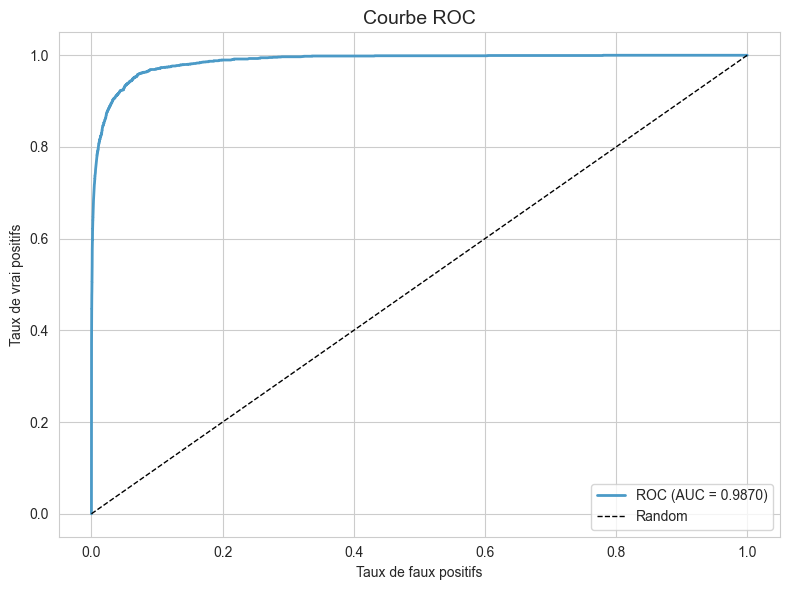

AUC Score : 0.9870


In [87]:
# === COURBE ROC ===
if hasattr(best_model, 'predict_proba'):
    Y_test_proba = best_model.predict_proba(X_test_processed)[:, 1]
    fpr, tpr, thresholds = roc_curve(Y_test, Y_test_proba)
    auc_score = roc_auc_score(Y_test, Y_test_proba)
    
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.plot(fpr, tpr, color=COLORS[0], lw=2, label=f'ROC (AUC = {auc_score:.4f})')
    ax.plot([0, 1], [0, 1], 'k--', lw=1, label='Random')
    ax.set_xlabel('Taux de faux positifs')
    ax.set_ylabel('Taux de vrai positifs')
    ax.set_title('Courbe ROC', fontsize=14)
    ax.legend(loc='lower right')
    plt.tight_layout()
    plt.show()
    
    print(f"AUC Score : {auc_score:.4f}")

In [ ]:
# Un score AUC de 1 serait un modèle parfait.
# Ce score AUC de 0.9870 est proche de 1 et indique donc que le modèle est très bon.
# Il distingue donc très bien les convertis des non-convertis dans la plupart des cas.

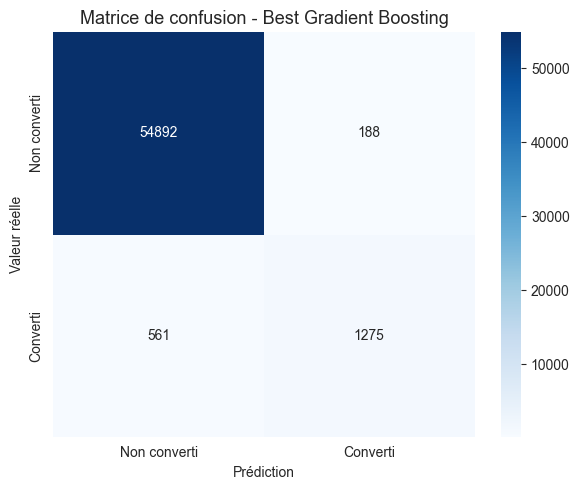

In [88]:
# === MATRICE DE CONFUSION VISUELLE ===
Y_test_pred_best = best_model.predict(X_test_processed)
cm = confusion_matrix(Y_test, Y_test_pred_best)

fig, ax = plt.subplots(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax,
            xticklabels=['Non converti', 'Converti'],
            yticklabels=['Non converti', 'Converti'])
ax.set_title(f'Matrice de confusion - {best_model_name}', fontsize=13)
ax.set_ylabel('Valeur réelle')
ax.set_xlabel('Prédiction')
plt.tight_layout()
plt.show()

In [70]:
# La "PRECISION" qui représente les vrais positifs sur l'ensemble des vrais positifs et faux positifs est 1241/(1241+211) = 85.47%
# (Mesure la fiabilité des prédictions positives)
# Le "RECALL" qui représente les vrais positifs sur l'ensemble des vrais positifs et faux négatifs est de 1241/(1241+595) = 67.59 %
# (mesure la capacité à détecter les occurences positives)
# La "SPECIFICITE" qui représente les vrais négatifs sur l'ensemble des vrais négatifs et des faux positifs est 54869/(54869+211) = 99.62%
# Le taux d'erreur global est le total des faux négatifs et faux positifs sur l'ensemble des prédictions : (595+211)/56916 = 1.42% 
# Score F1 = (2 * recall * precision) / (recall + precision) = (2 * 67.59% * 85.47 %) / (67.59%+85.47%) = 1.15538346/1.5306 = 75.48%
# (Moyenne harmonique de la précision et du recall permettant un équilibre entre les deux)

In [71]:
# On constate donc un modèle très précis qui a très bien détecté une très grande partie des négatifs (99.62 %)
# En revanche, les positifs n'ont été bien détectés qu'à hauteur de 67.59 %
# Selon l'objectif recherché, il faudra déterminer si on souhaite maximiser les conversions détectées ou minimiser les fausses alertes

In [89]:
# === REENTRAINEMENT SUR TOUTES LES DONNEES ===
data_full = pd.read_csv('conversion_data_train.csv')
data_full = data_full[data_full['age'] < 80].copy()
data_full = feature_engineering(data_full)

X_full = data_full[all_features]
Y_full = data_full[target_variable]

X_full_processed = preprocessor.fit_transform(X_full)

print(f"Réentrainement de {best_model_name} sur {X_full_processed.shape[0]} exemples...")
best_model.fit(X_full_processed, Y_full)


Réentrainement de Best Gradient Boosting sur 284578 exemples...


,"loss loss: {'log_loss', 'exponential'}, default='log_loss'The loss function to be optimized. 'log_loss' refers to binomial andmultinomial deviance, the same as used in logistic regression.It is a good choice for classification with probabilistic outputs.For loss 'exponential', gradient boosting recovers the AdaBoost algorithm.",'log_loss'
,"learning_rate learning_rate: float, default=0.1Learning rate shrinks the contribution of each tree by `learning_rate`.There is a trade-off between learning_rate and n_estimators.Values must be in the range `[0.0, inf)`.For an example of the effects of this parameter and its interaction with``subsample``, see:ref:`sphx_glr_auto_examples_ensemble_plot_gradient_boosting_regularization.py`.",0.1
,"n_estimators n_estimators: int, default=100The number of boosting stages to perform. Gradient boostingis fairly robust to over-fitting so a large number usuallyresults in better performance.Values must be in the range `[1, inf)`.",200
,"subsample subsample: float, default=1.0The fraction of samples to be used for fitting the individual baselearners. If smaller than 1.0 this results in Stochastic GradientBoosting. `subsample` interacts with the parameter `n_estimators`.Choosing `subsample < 1.0` leads to a reduction of varianceand an increase in bias.Values must be in the range `(0.0, 1.0]`.",0.8
,"criterion criterion: {'friedman_mse', 'squared_error'}, default='friedman_mse'The function to measure the quality of a split. Supported criteria are'friedman_mse' for the mean squared error with improvement score byFriedman, 'squared_error' for mean squared error. The default value of'friedman_mse' is generally the best as it can provide a betterapproximation in some cases... versionadded:: 0.18",'friedman_mse'
,"min_samples_split min_samples_split: int or float, default=2The minimum number of samples required to split an internal node:- If int, values must be in the range `[2, inf)`.- If float, values must be in the range `(0.0, 1.0]` and `min_samples_split` will be `ceil(min_samples_split * n_samples)`... versionchanged:: 0.18 Added float values for fractions.",2
,"min_samples_leaf min_samples_leaf: int or float, default=1The minimum number of samples required to be at a leaf node.A split point at any depth will only be considered if it leaves atleast ``min_samples_leaf`` training samples in each of the left andright branches. This may have the effect of smoothing the model,especially in regression.- If int, values must be in the range `[1, inf)`.- If float, values must be in the range `(0.0, 1.0)` and `min_samples_leaf` will be `ceil(min_samples_leaf * n_samples)`... versionchanged:: 0.18 Added float values for fractions.",1
,"min_weight_fraction_leaf min_weight_fraction_leaf: float, default=0.0The minimum weighted fraction of the sum total of weights (of allthe input samples) required to be at a leaf node. Samples haveequal weight when sample_weight is not provided.Values must be in the range `[0.0, 0.5]`.",0.0
,"max_depth max_depth: int or None, default=3Maximum depth of the individual regression estimators. The maximumdepth limits the number of nodes in the tree. Tune this parameterfor best performance; the best value depends on the interactionof the input variables. If None, then nodes are expanded untilall leaves are pure or until all leaves contain less thanmin_samples_split samples.If int, values must be in the range `[1, inf)`.",5
,"min_impurity_decrease min_impurity_decrease: float, default=0.0A node will be split if this split induces a decrease of the impuritygreater than or equal to this value.Values must be in the range `[0.0, inf)`.The weighted impurity decrease equation is the following:: N_t / N * (impurity - N_t_R / N_t * right_impurity - N_t_L / N_t * left_impurity)where ``N`` is the total number of samples, ``N_t`` is the number ofsamples at the current node, ``N_t_L`` is the number of samples in theleft child, and ``N_t_R`` is the number of samples in the right child.``N``, ``N_t``, 

In [73]:
# === PREDICTIONS SUR LE FICHIER TEST ===
data_test = pd.read_csv('conversion_data_test.csv')
print(f'Format de la base Test : {data_test.shape}')
display(data_test.head())

data_test = feature_engineering(data_test)
X_test_final = data_test[all_features]
X_test_final_processed = preprocessor.transform(X_test_final)

predictions = best_model.predict(X_test_final_processed)

print(f"\nPrédictions générées : {len(predictions)}")
print(f"Distribution : {pd.Series(predictions).value_counts().to_dict()}")
print(f"Taux de conversion prédit : {predictions.mean()*100:.2f}%")

Format de la base Test : (31620, 5)


,country,age,new_user,source,total_pages_visited
0,UK,28,0,Seo,16
1,UK,22,1,Direct,5
2,China,32,1,Seo,1
3,US,32,1,Ads,6
4,China,25,0,Seo,3



Prédictions générées : 31620
Distribution : {0: 30792, 1: 828}
Taux de conversion prédit : 2.62%


In [74]:
# Le modèle a prédit 828 conversions sur 31620 visiteurs soit un niveau de prédiction de 2.62 % sur le fichier test.
# En comparaison, la proportion sur le fichier d'entrainement complet était de 3.23 %.
# S'il est un peu plus faible, cela peut être dû à une composition un peu différente
# dans le dataset de test par rapport à celui d'entrainement.

In [ ]:
# === EXPORT DES PREDICTIONS DANS UN FICHIER .csv ===
output = pd.DataFrame({'converted': predictions})
output_filename = 'conversion_data_test_predictions_TEAM-best-model.csv'
output.to_csv(output_filename, index=False)

print(f"Fichier exporté : {output_filename}")
print(f"Vérification :")
check = pd.read_csv(output_filename)
print(f"  Format base de données, : {check.shape}")
print(f"  Colonnes : {check.columns.tolist()}")
print(f"  Distribution : {check['converted'].value_counts().to_dict()}")
display(check.head(10))

Fichier exporte : conversion_data_test_predictions_TEAM-best-model.csv
Vérification :
  Format base de données, : (31620, 1)
  Colonnes : ['converted']
  Distribution : {0: 30792, 1: 828}


,converted
0,1
1,0
2,0
3,0
4,0
5,0
6,0
7,0
8,0
9,0


In [90]:
print("="*70)
print("RECOMMANDATIONS POUR AMELIORER LE TAUX DE CONVERSION")
print("="*70)

print("""
1. ENGAGEMENT (total_pages_visited) - LEVIER PRINCIPAL
   => C'est la variable la plus influente. Les convertis visitent en moyenne 
      14.6 pages vs 4.6 pour les non-convertis.
   => ACTION : Améliorer la navigation du site, proposer du contenu 
      recommandé, et placer des bulletins d'inscription après 8-10 pages, 
      niveau à partir duquel les conversions deviennent plus fréquentes.

2. FIDELISATION (new_user) - LEVIER FORT
   => Les anciens utilisateurs convertissent 5x plus (7.2 % vs 1.4 %).
   => ACTION : Mettre en place des mécanismes de ré-engagement 
      (email de bienvenue, notifications, contenus exclusifs).

3. AGE - CIBLAGE JEUNE
   => Les jeunes (17-25 ans) convertissent 2-3x plus.
   => ACTION : Adapter le marketing vers les jeunes professionnels 
      et étudiants en data science.

4. GEOGRAPHIE - FOCUS SUR LA CHINE
   => La Chine a un taux de conversion 50x plus faible (0.13%).
   => ACTION : rechercher les raisons (Barrière de la langue ? 
      Contenu non adapté ? Concurrence locale ?).
      Potentiel fort d'amélioration si on parvient à s'adresser à ce marché.

5. SOURCE DE TRAFIC - DIFFERENCES MINEURES
   => Ads convertit légèrement mieux que Direct.
   => ACTION : Optimiser les campagnes publicitaires.
""")

RECOMMANDATIONS POUR AMELIORER LE TAUX DE CONVERSION

1. ENGAGEMENT (total_pages_visited) - LEVIER PRINCIPAL
   => C'est la variable la plus influente. Les convertis visitent en moyenne 
      14.6 pages vs 4.6 pour les non-convertis.
   => ACTION : Améliorer la navigation du site, proposer du contenu 
      recommandé, et placer des bulletins d'inscription après 8-10 pages, 
      niveau à partir duquel les conversions deviennent plus fréquentes.

2. FIDELISATION (new_user) - LEVIER FORT
   => Les anciens utilisateurs convertissent 5x plus (7.2 % vs 1.4 %).
   => ACTION : Mettre en place des mécanismes de ré-engagement 
      (email de bienvenue, notifications, contenus exclusifs).

3. AGE - CIBLAGE JEUNE
   => Les jeunes (17-25 ans) convertissent 2-3x plus.
   => ACTION : Adapter le marketing vers les jeunes professionnels 
      et étudiants en data science.

4. GEOGRAPHIE - FOCUS SUR LA CHINE
   => La Chine a un taux de conversion 50x plus faible (0.13%).
   => ACTION : rechercher 

In [ ]:
print("\n" + "="*70)
print("RESUME FINAL")
print("="*70)
print(f"\nModèle baseline (LR univariee)      : F1 = ~0.70")
print(f"Meilleur modèle ({best_model_name}) : F1 = {best_results_df.iloc[0]['F1 Test']:.4f}")
print(f"\nFichier de prédictions : {output_filename}")
print(f"Nombre de prédictions  : {len(predictions)}")
print(f"Taux de conversion prédit : {predictions.mean()*100:.2f}%")



RESUME FINAL

Modele baseline (LR univariee)      : F1 = ~0.70
Meilleur modele (Best Gradient Boosting) : F1 = 0.7549

Fichier de predictions : conversion_data_test_predictions_TEAM-best-model.csv
Nombre de predictions  : 31620
Taux de conversion predit : 2.62%

Bonne chance pour le leaderboard !
